In [1]:
import sys
print(sys.executable)

C:\Users\OttoP\.conda\envs\ADTA\python.exe


In [2]:
ls

 Volume in drive G is Google Drive
 Volume Serial Number is 1983-1116

 Directory of G:\My Drive\1. ADTA Program Files\0. ADTA Classes\ADTA 5410 - Group 5\1. Weekly Challenges

07/03/2025  11:25 PM    <DIR>          .
07/01/2025  12:24 PM    <DIR>          ..
07/03/2025  11:25 PM    <DIR>          .ipynb_checkpoints
07/02/2025  12:27 PM         1,738,770 Brittney_CLV_preprocessing_analysis.ipynb
07/03/2025  11:14 PM        76,662,877 CLEANED_synthetic_ecommerce_2025-06-13_Version2.csv
07/03/2025  11:25 PM        11,436,582 Otto_CLV_preprocessing.ipynb
06/28/2025  05:09 PM        58,253,960 synthetic_ecommerce_2025-06-13_Version2.csv
07/01/2025  11:05 AM    <DIR>          Weekly Challenge 3
07/01/2025  11:05 AM    <DIR>          Weekly Challenge 4
               4 File(s)    148,092,189 bytes
               5 Dir(s)   4,285,120,512 bytes free


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sys, os, glob

# plot figsize settings
small_plt = [3,3]
med_plt = [6,6]
big_plt = [9,9]
short_plt = [14,3]
wide_plt = [14,9]

In [4]:
df = pd.read_csv("synthetic_ecommerce_2025-06-13_Version2.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   customer_id               300000 non-null  int64  
 1   signup_date               300000 non-null  object 
 2   last_activity_ts          300000 non-null  object 
 3   recency_days              300000 non-null  int64  
 4   total_spend_12m           300000 non-null  float64
 5   avg_basket_value          300000 non-null  float64
 6   sessions_90d              300000 non-null  int64  
 7   days_since_last_purchase  300000 non-null  int64  
 8   items_per_order           300000 non-null  int64  
 9   loyalty_points            300000 non-null  int64  
 10  returns_12m               300000 non-null  int64  
 11  site_search_rate          300000 non-null  float64
 12  email_open_rate           275972 non-null  float64
 13  discount_pct_last_order   298445 non-null  f

In [6]:
df.head()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,...,total_orders_12m,avg_time_between_orders,is_premium_member,marketing_opt_in,preferred_device,country_code,customer_segment,primary_browser,next_product_cat,clv_3yr_usd
0,1,2023-01-27,2025-04-16 01:58:26.529018164,57,4174.02,30.83,22,18,3,489,...,135,2.1,No,No,SmartTV,GB,Segment_9,Browser_13,Apparel,4948.64
1,2,2020-01-08,2020-10-29 06:21:54.215300560,1687,7185.10,42.50,0,1,5,485,...,0,NaN,No,Yes,Other,DE,Segment_10,Browser_17,Home_Garden,7867.41
2,3,2023-03-22,2024-05-18 17:34:30.651219606,390,11067.80,61.66,0,42,6,506,...,0,NaN,Yes,Yes,Desktop,IT,Segment_10,Browser_1,Sports,13294.63
3,4,2021-09-18,2024-01-29 17:50:06.211375475,500,659.84,39.83,0,57,3,441,...,0,NaN,No,Yes,Tablet,NO,Segment_20,Browser_15,Sports,800.40
4,5,2021-12-23,2023-02-10 13:14:47.794090986,853,4831.90,49.10,0,19,2,463,...,0,NaN,No,Yes,Desktop,IE,Segment_20,Browser_1,Apparel,5704.24


In [7]:
df['signup_date'] = pd.to_datetime(df['signup_date'])
df['last_activity_ts'] = pd.to_datetime(df['last_activity_ts'])
df['date_pulled'] = pd.to_datetime('2025-06-13')
# df['time_ratio'] = df['last_activity_ts'] - df['signup_date']

In [8]:
df.describe()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,returns_12m,site_search_rate,email_open_rate,discount_pct_last_order,total_orders_12m,avg_time_between_orders,clv_3yr_usd,date_pulled
count,300000.000000,300000,300000,300000.000000,300000.000000,300000.00000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,275972.000000,298445.000000,300000.000000,120841.000000,300000.000000,300000
mean,150000.500000,2021-09-21 17:26:59.711999744,2023-08-02 15:27:55.843986176,679.856327,6194.101341,50.08110,2.937477,29.965033,4.000120,499.848950,2.000243,0.285783,0.299995,10.051905,66.333653,13.090248,6900.419667,2025-06-13 00:00:00
min,1.000000,2018-01-01 00:00:00,2018-01-09 12:30:27.446097851,0.000000,9.840000,5.00000,0.000000,0.000000,1.000000,-540.000000,0.000000,0.000289,0.002823,0.000000,0.000000,0.100000,116.630000,2025-06-13 00:00:00
25%,75000.750000,2019-11-12 00:00:00,2022-08-08 12:13:25.450714368,184.000000,1323.002500,36.48000,0.000000,9.000000,3.000000,485.000000,1.000000,0.161185,0.195709,6.617562,0.000000,1.800000,1578.235000,2025-06-13 00:00:00
50%,150000.500000,2021-09-22 00:00:00,2024-01-20 05:17:24.062454528,509.000000,2975.475000,49.99000,0.000000,21.000000,4.000000,500.000000,2.000000,0.264657,0.286145,10.004121,0.000000,7.000000,3389.295000,2025-06-13 00:00:00
75%,225000.250000,2023-08-01 00:00:00,2024-12-10 13:08:45.863225600,1039.000000,6705.050000,63.50000,0.000000,42.000000,5.000000,515.000000,3.000000,0.389466,0.390361,13.380474,44.000000,14.800000,7472.862500,2025-06-13 00:00:00
max,300000.000000,2026-06-12 00:00:00,2025-06-12 23:59:44.059004784,2711.000000,694278.250000,136.71000,41.000000,412.000000,15.000000,608.000000,12.000000,0.932675,0.927149,33.240327,33567.000000,376.400000,744597.890000,2025-06-13 00:00:00
std,86602.684716,NaN,NaN,599.398069,11169.398333,19.81922,7.279116,29.913803,1.731788,24.465834,1.417447,0.159940,0.138155,4.908568,287.251192,23.305234,12289.212628,NaN


In [9]:
# Create Classification summary table
df_types = df.dtypes.reset_index()
df_types.columns = ['Feature Label', 'Data Type']

df_types['Data Type'] = df_types['Data Type'].astype(str)

# Define logic for classifying variables
def classify_variable(dtype_str):
    if 'int' in dtype_str or 'float' in dtype_str:
        return 'Numeric'
    elif 'datetime' in dtype_str:
        return 'Datetime'
    else:
        return 'Categorical'

#Apply classification
df_types['Classification'] = df_types['Data Type'].apply(classify_variable)

#Show final table
df_types = df_types[['Feature Label', 'Data Type', 'Classification']]
df_types

,Feature Label,Data Type,Classification
0,customer_id,int64,Numeric
1,signup_date,datetime64[ns],Datetime
2,last_activity_ts,datetime64[ns],Datetime
3,recency_days,int64,Numeric
4,total_spend_12m,float64,Numeric
5,avg_basket_value,float64,Numeric
6,sessions_90d,int64,Numeric
7,days_since_last_purchase,int64,Numeric
8,items_per_order,int64,Numeric
9,loyalty_points,int64,Numeric


In [10]:
# Create a function that provides exploration analytics on a given column with mixed data types.
def val_type(data, column):
    new_col = f"{column}_value_type"
    data[new_col] = data[column].apply(lambda x: type(x).__name__)
    distribution = round(data[new_col].value_counts(normalize=True) * 100, 2)
    return data, distribution

In [11]:
# Identify columns with multiple data types or nulls
explore_df = df.copy()
cols = explore_df.columns

for x in cols:
    explore_df, distribution = val_type(explore_df, x)
    null_count = df[x].isna().sum()
    if len(distribution) > 1:
        print("----------")
        print(distribution)
    if null_count > 1:
        print("----------")
        print(distribution)
        print(f"Null count: {null_count}")

----------
email_open_rate_value_type
float    100.0
Name: proportion, dtype: float64
Null count: 24028
----------
discount_pct_last_order_value_type
float    100.0
Name: proportion, dtype: float64
Null count: 1555
----------
avg_time_between_orders_value_type
float    100.0
Name: proportion, dtype: float64
Null count: 179159


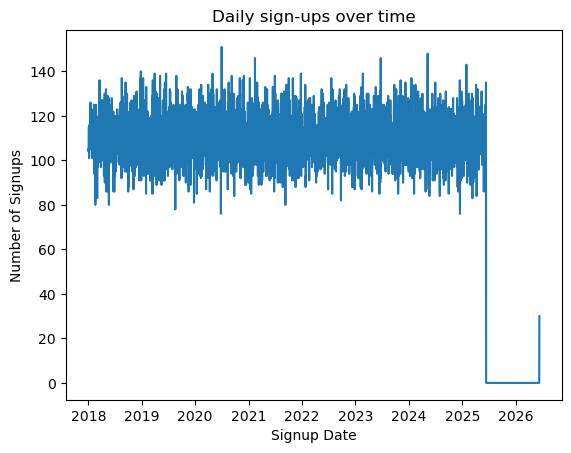

In [12]:
# signup dates contain data anomalies in the future
daily = (
    df.set_index('signup_date').resample('D').size().rename('signups').reset_index()
)

sns.lineplot(data=daily, x='signup_date', y='signups')
plt.xlabel('Signup Date')
plt.ylabel('Number of Signups')
plt.title('Daily sign-ups over time')
plt.show()

In [13]:
# Isolate the bad signup dates
bad_signup_date = df.loc[df['signup_date'].dt.year == 2026].copy()
print("Count of rows with year 2026:", len(bad_signup_date))

Count of rows with year 2026: 30


In [14]:
# Observe isolated records
bad_signup_date.describe()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,returns_12m,site_search_rate,email_open_rate,discount_pct_last_order,total_orders_12m,avg_time_between_orders,clv_3yr_usd,date_pulled
count,30.000000,30,30,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,29.000000,30.000000,30.000000,13.000000,30.000000,30
mean,157164.933333,2026-06-12 00:00:00,2022-12-28 12:57:01.239860224,896.900000,8429.966667,48.320000,4.066667,40.333333,3.866667,-504.166667,2.033333,0.276551,0.249434,9.714894,35.700000,19.876923,5045.412000,2025-06-13 00:00:00
min,19677.000000,2026-06-12 00:00:00,2018-07-24 14:43:03.563778877,0.000000,24.000000,15.170000,0.000000,1.000000,1.000000,-540.000000,0.000000,0.027458,0.051588,0.520270,0.000000,0.100000,351.000000,2025-06-13 00:00:00
25%,99343.250000,2026-06-12 00:00:00,2020-06-28 21:24:50.536869120,147.250000,1313.000000,34.940000,0.000000,9.000000,3.000000,-519.000000,1.000000,0.154427,0.161225,7.895381,0.000000,4.400000,1672.870000,2025-06-13 00:00:00
50%,144344.000000,2026-06-12 00:00:00,2023-09-22 21:38:04.903542784,629.000000,3827.500000,49.545000,0.000000,22.500000,4.000000,-508.500000,2.000000,0.268353,0.239684,10.401955,0.000000,9.600000,2638.100000,2025-06-13 00:00:00
75%,211069.000000,2026-06-12 00:00:00,2025-01-16 11:31:46.624643584,1809.500000,6903.250000,62.362500,0.000000,56.000000,4.000000,-489.500000,3.000000,0.362389,0.290820,12.774741,53.000000,14.400000,5474.590000,2025-06-13 00:00:00
max,298155.000000,2026-06-12 00:00:00,2025-06-12 02:06:27.126535654,2515.000000,87201.000000,78.590000,24.000000,191.000000,9.000000,-430.000000,5.000000,0.618518,0.508352,17.997122,325.000000,73.900000,36381.250000,2025-06-13 00:00:00
std,83845.301115,NaN,NaN,888.292836,17088.044380,17.363941,8.353952,45.008301,1.851995,24.797224,1.325697,0.157930,0.117021,4.319669,71.107083,25.291275,7041.797022,NaN


In [15]:
# All loyalty points with the bad_signup_dates are negative
print("Bad signup dates with negative loyalty points:", len(bad_signup_date['loyalty_points']))
print(bad_signup_date['loyalty_points'])

Bad signup dates with negative loyalty points: 30
19676    -519
24582    -474
40483    -518
44754    -519
52668    -508
86994    -482
89971    -525
94468    -526
113965   -540
126785   -453
127379   -430
128190   -486
129155   -494
137442   -494
142689   -506
145997   -537
153551   -509
157060   -512
170248   -508
176413   -529
191316   -534
199914   -510
214786   -525
254086   -518
262528   -488
268099   -508
282896   -501
289699   -512
290970   -486
298154   -474
Name: loyalty_points, dtype: int64


Loyalty Point Range: [-540, 540]


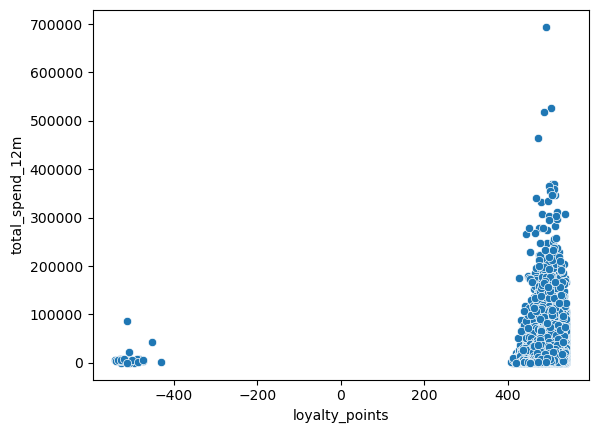

In [16]:
min_LP_range = df['loyalty_points'].min()

set_LP_range = [min_LP_range, abs(min_LP_range)]

print("Loyalty Point Range:",set_LP_range)

LP_anomalies = df.loc[df['loyalty_points'] < set_LP_range[1]].copy()

def LP_flag(LP):
    if LP < 0:
        return True
    else:
        return False

LP_anomalies['LP_boolean'] = LP_anomalies['loyalty_points'].apply(LP_flag)

sns.scatterplot(LP_anomalies, x=LP_anomalies['loyalty_points'], y='total_spend_12m')
plt.show()

### The negative `loyalty_points` appear symetrically clustered compared to positive values. These data anomalies appear structured and likely of a sign flip.

In [17]:
# Check if this is all of the negative loyalty points
neg_loyalty_points = df.loc[df['loyalty_points'] < 0, 'loyalty_points'].index
print("Total record with negative loyalty points:", len(neg_loyalty_points))

Total record with negative loyalty points: 30


In [18]:
# Match the index of records to ensure both samples of 30 are true

bad_signup_date_loyalty_points_index = bad_signup_date.loc[bad_signup_date['loyalty_points'] < 0, 'loyalty_points'].index
loyalty_point_index_check = set(zip(neg_loyalty_points, bad_signup_date_loyalty_points_index))
index_zip = list(zip(neg_loyalty_points, bad_signup_date_loyalty_points_index))
flat_index_len = len(set(np.array(index_zip).flatten()))

print("Matching records for loyalty points:", flat_index_len)

Matching records for loyalty points: 30


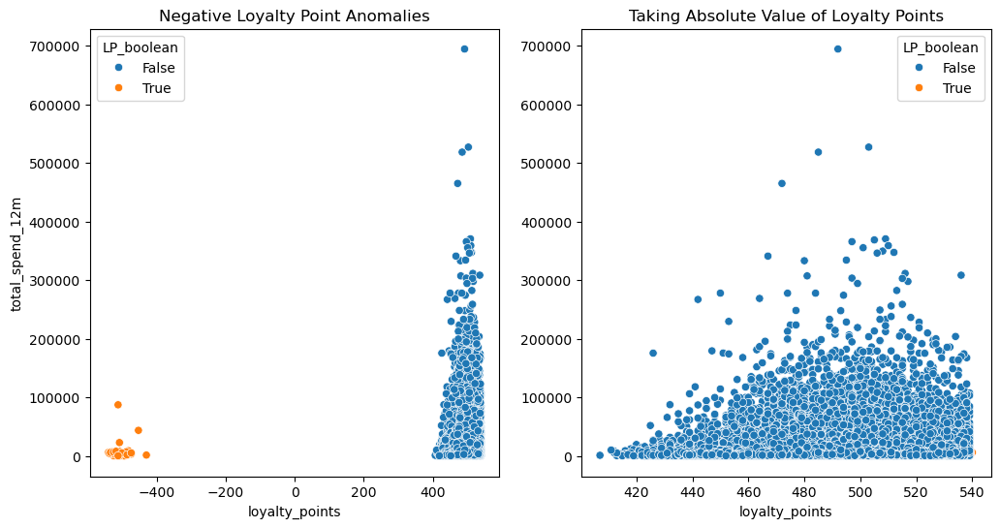

In [19]:
# Review the differences in data before and after taking the absolute value

plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
sns.scatterplot(LP_anomalies, x=LP_anomalies['loyalty_points'], y='total_spend_12m', hue='LP_boolean')
plt.title("Negative Loyalty Point Anomalies")
plt.subplot(1, 2, 2)
sns.scatterplot(LP_anomalies, x=LP_anomalies['loyalty_points'].abs(), y='total_spend_12m', hue='LP_boolean')
plt.title("Taking Absolute Value of Loyalty Points")
plt.ylabel(ylabel='')
plt.show()

In [20]:
# Is this the only bad piece of data for these records?
bad_signup_date.describe()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,returns_12m,site_search_rate,email_open_rate,discount_pct_last_order,total_orders_12m,avg_time_between_orders,clv_3yr_usd,date_pulled
count,30.000000,30,30,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,29.000000,30.000000,30.000000,13.000000,30.000000,30
mean,157164.933333,2026-06-12 00:00:00,2022-12-28 12:57:01.239860224,896.900000,8429.966667,48.320000,4.066667,40.333333,3.866667,-504.166667,2.033333,0.276551,0.249434,9.714894,35.700000,19.876923,5045.412000,2025-06-13 00:00:00
min,19677.000000,2026-06-12 00:00:00,2018-07-24 14:43:03.563778877,0.000000,24.000000,15.170000,0.000000,1.000000,1.000000,-540.000000,0.000000,0.027458,0.051588,0.520270,0.000000,0.100000,351.000000,2025-06-13 00:00:00
25%,99343.250000,2026-06-12 00:00:00,2020-06-28 21:24:50.536869120,147.250000,1313.000000,34.940000,0.000000,9.000000,3.000000,-519.000000,1.000000,0.154427,0.161225,7.895381,0.000000,4.400000,1672.870000,2025-06-13 00:00:00
50%,144344.000000,2026-06-12 00:00:00,2023-09-22 21:38:04.903542784,629.000000,3827.500000,49.545000,0.000000,22.500000,4.000000,-508.500000,2.000000,0.268353,0.239684,10.401955,0.000000,9.600000,2638.100000,2025-06-13 00:00:00
75%,211069.000000,2026-06-12 00:00:00,2025-01-16 11:31:46.624643584,1809.500000,6903.250000,62.362500,0.000000,56.000000,4.000000,-489.500000,3.000000,0.362389,0.290820,12.774741,53.000000,14.400000,5474.590000,2025-06-13 00:00:00
max,298155.000000,2026-06-12 00:00:00,2025-06-12 02:06:27.126535654,2515.000000,87201.000000,78.590000,24.000000,191.000000,9.000000,-430.000000,5.000000,0.618518,0.508352,17.997122,325.000000,73.900000,36381.250000,2025-06-13 00:00:00
std,83845.301115,NaN,NaN,888.292836,17088.044380,17.363941,8.353952,45.008301,1.851995,24.797224,1.325697,0.157930,0.117021,4.319669,71.107083,25.291275,7041.797022,NaN


In [21]:
# take the absolute value of loyalty points and set future dates to NaN
df_revised = df.copy().reindex()
df_revised['loyalty_points'] = df_revised['loyalty_points'].abs()
df_revised.loc[df_revised['signup_date'].dt.year == 2026, 'signup_date'] = pd.NaT

print("List of all missing values")
print(df_revised.isna().sum())

List of all missing values
customer_id                      0
signup_date                     30
last_activity_ts                 0
recency_days                     0
total_spend_12m                  0
avg_basket_value                 0
sessions_90d                     0
days_since_last_purchase         0
items_per_order                  0
loyalty_points                   0
returns_12m                      0
site_search_rate                 0
email_open_rate              24028
discount_pct_last_order       1555
total_orders_12m                 0
avg_time_between_orders     179159
is_premium_member                0
marketing_opt_in                 0
preferred_device                 0
country_code                     0
customer_segment                 0
primary_browser                  0
next_product_cat                 0
clv_3yr_usd                      0
date_pulled                      0
dtype: int64


In [22]:
df_missingness = df_revised.copy()

cols_missingness = ['signup_date', 'email_open_rate', 'discount_pct_last_order', 'avg_time_between_orders']

# Pairplot of all fields
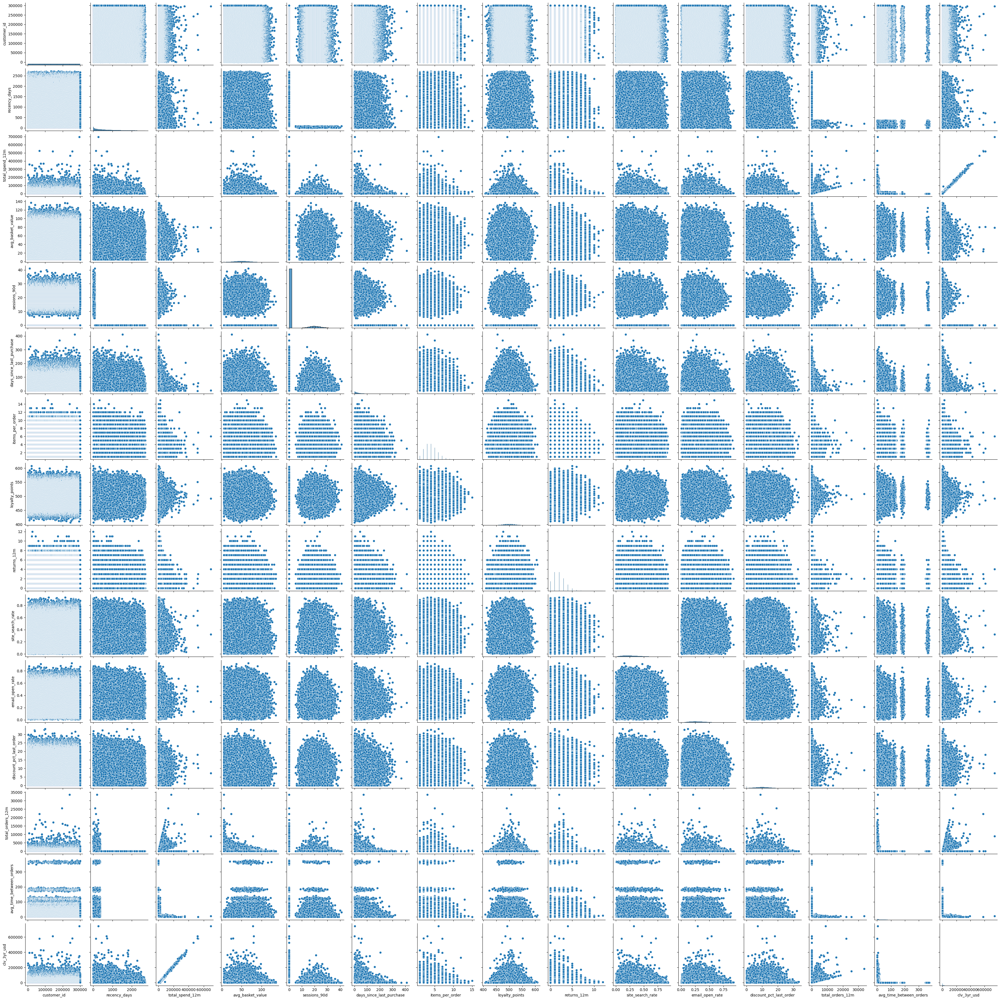

## Determine missingness imputation for `discount_pct_last_order`

Mean before imputation: 10.05
Mean after imputation: 10.00
Safe to impute Zero's to data


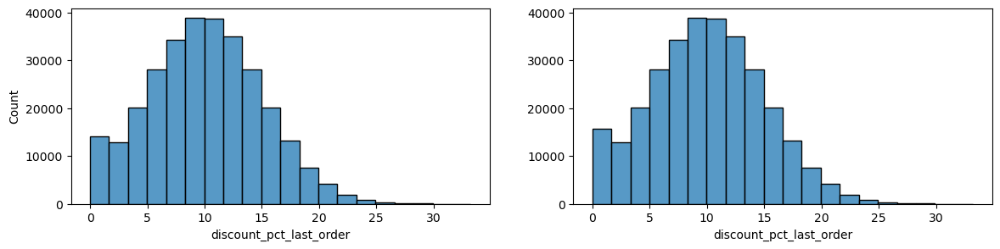

np.int64(0)

In [23]:
missing_disc = pd.DataFrame(df_missingness[cols_missingness[2]])
impute_disc = pd.DataFrame(df_missingness[cols_missingness[2]].fillna(0))

missing_disc_mean = missing_disc.mean()
impute_disc_mean = impute_disc.mean()

print(f"Mean before imputation: {missing_disc_mean.iloc[0]:.2f}")
print(f"Mean after imputation: {impute_disc_mean.iloc[0]:.2f}")
print("Safe to impute Zero's to data")

plt.figure(figsize=short_plt)
plt.subplot(1,2,1)
sns.histplot(missing_disc, x='discount_pct_last_order', bins=20)
plt.subplot(1,2,2)
sns.histplot(impute_disc, x='discount_pct_last_order', bins=20)
plt.ylabel(ylabel='')
plt.show()


df_missingness['discount_pct_last_order'] = df_missingness['discount_pct_last_order'].fillna(0)
df_missingness['discount_pct_last_order'].isna().sum()

## Determine missingness imputation for `signup_date`

Mean before imputation: 2021-09-21 13:18:40.504050432
Mean after imputation: 2021-09-21 13:18:40.504049920
Safe to impute dates with the mean


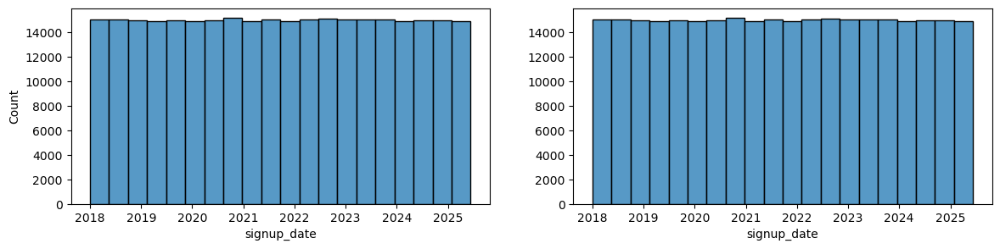

np.int64(0)

In [24]:
signup_mean = df_missingness['signup_date'].mean()

missing_date = pd.DataFrame(df_missingness[cols_missingness[0]])
impute_date = pd.DataFrame(df_missingness[cols_missingness[0]].fillna(signup_mean))

date_mean = missing_date.mean()
impute_mean = impute_date.mean()

print(f"Mean before imputation: {date_mean.iloc[0]}")
print(f"Mean after imputation: {impute_mean.iloc[0]}")
print("Safe to impute dates with the mean")

plt.figure(figsize=short_plt)
plt.subplot(1,2,1)
sns.histplot(missing_date, x='signup_date', bins=20)
plt.subplot(1,2,2)
sns.histplot(impute_date, x='signup_date', bins=20)
plt.ylabel(ylabel='')
plt.show()


df_missingness['signup_date'] = df_missingness['signup_date'].fillna(signup_mean)
df_missingness['signup_date'].isna().sum()

## Determine missingness imputation for `email_open_rate`

In [25]:
# complete an analysis on missing emails
df_missing_emails = df_missingness.copy()


def email_flag(email):
    if pd.isna(email):
        return True
    else:
        return False

df_missing_emails['bool_email_open_rate'] = df_missing_emails['email_open_rate'].apply(email_flag)

df_missing_emails['bool_email_open_rate'].value_counts()



bool_email_open_rate
False    275972
True      24028
Name: count, dtype: int64

In [26]:
# # bivariate analysis to see if there is a visual difference in users that have not opened emails
# import math

# focus = 'bool_email_open_rate'
# others = df_missing_emails.drop(columns='customer_id', axis=1).select_dtypes(include='number').columns.difference([focus])
# n_panels = len(others)


# n_cols = 4
# n_rows = math.ceil(n_panels / n_cols)

# fig, axes = plt.subplots(n_rows, n_cols,
#                           figsize=(3.2*n_cols, 2.8*n_rows),
#                           sharex=True,  sharey=False)
# axes = axes.flatten()


# for ax, col in zip(axes, others):
#     sns.boxplot(data=df_missing_emails, x=focus, y=col,
#                 orient='v', ax=ax, fliersize=2, linewidth=.8)
#     ax.set_title(col, fontsize=9)
#     ax.set_xlabel('')
#     ax.set_ylabel('')
#     ax.tick_params(axis='x', rotation=0)


# for extra in axes[n_panels:]:
#     extra.set_visible(False)

# fig.suptitle(f'{focus} compared with {n_panels} other variables',
#              fontsize=12, y=1.02)
# fig.tight_layout()
# plt.show()


In [27]:
# Observe relationship of null emails with marketing opt in
pd.crosstab(index=df_missing_emails['bool_email_open_rate'], columns=df_missing_emails['marketing_opt_in'])

marketing_opt_in,No,Yes
bool_email_open_rate,,
False,96465,179507
True,24028,0


## Emails are NULL when a user is opted out of marketing. 
### This means:
- some users opted out of marketing after opening some emails
- some users opted out of marketing before opening any emails

Mean before imputation: 0.30
Mean after imputing with Zeros: 0.28
Impute null email open rates with 0.


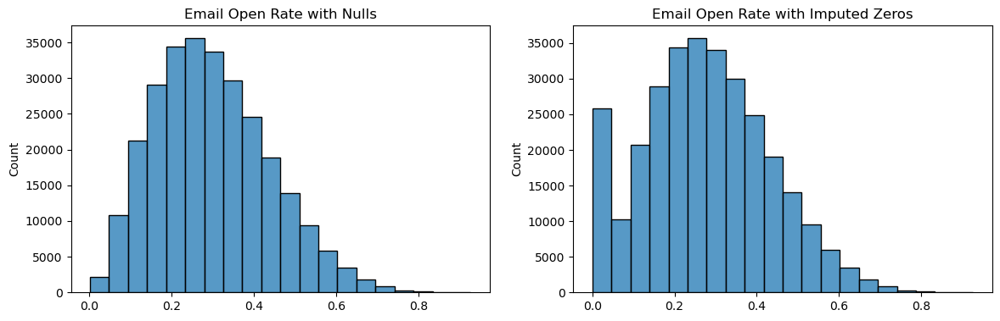

np.int64(0)

In [28]:
# Comparison of imputing with zeros and the mean
missing_email = pd.DataFrame(df_missingness[cols_missingness[1]])
impute_email_zero = pd.DataFrame(df_missingness[cols_missingness[1]].fillna(0))

# email_mean = df_missingness['email_open_rate'].mean()
# impute_email_mean = pd.DataFrame(df_missingness[cols_missingness[1]].fillna(email_mean))

# email_median = df_missingness['email_open_rate'].median()
# imput_email_median = pd.DataFrame(df_missingness[cols_missingness[1]].fillna(email_median))

missing_email_avg = missing_email.mean()
impute_email_zero_avg = impute_email_zero.mean()
# impute_email_mean_avg = impute_email_mean.mean()
# impute_email_median_avg = imput_email_median.mean()

print(f"Mean before imputation: {missing_email_avg.iloc[0]:.2f}")
print(f"Mean after imputing with Zeros: {impute_email_zero_avg.iloc[0]:.2f}")
# print(f"Mean after imputing with Mean: {impute_email_mean_avg.iloc[0]:.2f}")
# print(f"Mean after imputing with Median: {impute_email_median_avg.iloc[0]:.2f}")
print("Impute null email open rates with 0.")

plt.figure(figsize=wide_plt)
plt.subplot(2,2,1)
sns.histplot(missing_email, x='email_open_rate', bins=20)
plt.title('Email Open Rate with Nulls')
plt.xlabel(xlabel='')
plt.subplot(2,2,2)
sns.histplot(impute_email_zero, x='email_open_rate', bins=20)
plt.title('Email Open Rate with Imputed Zeros')
plt.xlabel(xlabel='')
# plt.subplot(2,2,3)
# sns.histplot(impute_email_mean, x='email_open_rate', bins=20)
# plt.title('Email Open Rate with Imputed Mean')
# plt.xlabel(xlabel='')
# plt.subplot(2,2,4)
# sns.histplot(imput_email_median, x='email_open_rate', bins=20)
# plt.title('Email Open Rate with Imputed Median')
# plt.xlabel(xlabel='')
plt.show()

df_missingness['email_open_rate'] = df_missingness['email_open_rate'].fillna(0)
df_missingness['email_open_rate'].isna().sum()

In [29]:
df_ATBO = df_missingness.copy()

def ATBO_flag(atbo):
    if pd.isna(atbo):
        return True
    else:
        return False

df_ATBO['bool_ATBO'] = df_missing_emails['avg_time_between_orders'].apply(ATBO_flag)

df_ATBO['bool_ATBO'].value_counts() / len(df_ATBO['bool_ATBO'])

bool_ATBO
True     0.597197
False    0.402803
Name: count, dtype: float64

In [30]:
df_ATBO.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   customer_id               300000 non-null  int64         
 1   signup_date               300000 non-null  datetime64[ns]
 2   last_activity_ts          300000 non-null  datetime64[ns]
 3   recency_days              300000 non-null  int64         
 4   total_spend_12m           300000 non-null  float64       
 5   avg_basket_value          300000 non-null  float64       
 6   sessions_90d              300000 non-null  int64         
 7   days_since_last_purchase  300000 non-null  int64         
 8   items_per_order           300000 non-null  int64         
 9   loyalty_points            300000 non-null  int64         
 10  returns_12m               300000 non-null  int64         
 11  site_search_rate          300000 non-null  float64       
 12  em

<Axes: xlabel='sessions_90d', ylabel='Count'>

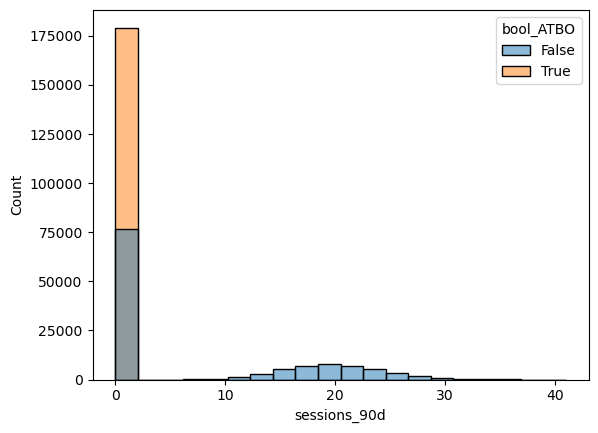

In [31]:
# sns.scatterplot(df_ATBO, x='recency_days', y='sessions_90d', hue='bool_ATBO')

sns.histplot(df_ATBO, x='sessions_90d', hue='bool_ATBO')

<Axes: xlabel='avg_basket_value', ylabel='Count'>

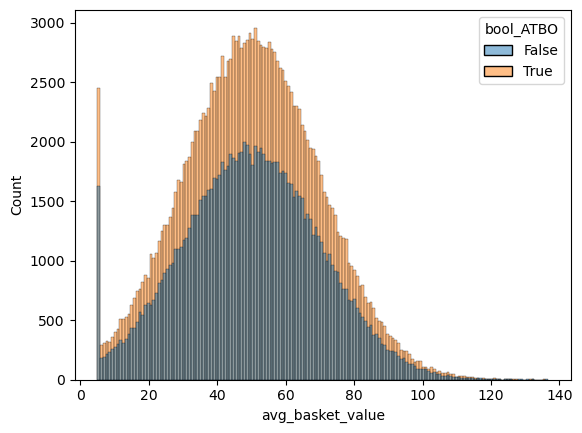

In [32]:
sns.histplot(df_ATBO, x='avg_basket_value', hue='bool_ATBO')

<Axes: xlabel='avg_basket_value', ylabel='days_since_last_purchase'>

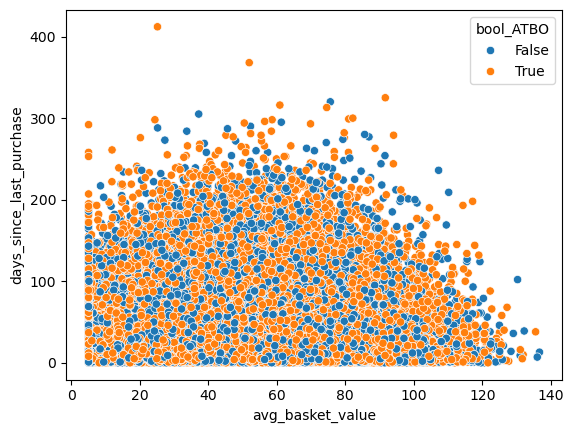

In [33]:
sns.scatterplot(df_ATBO, y='days_since_last_purchase', x='avg_basket_value', hue='bool_ATBO')

<Axes: xlabel='loyalty_points', ylabel='Count'>

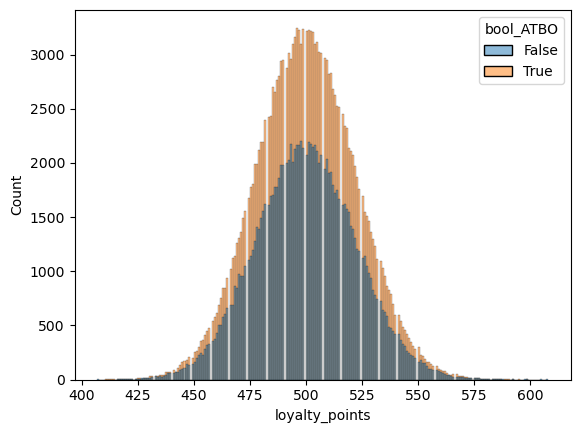

In [34]:
sns.histplot(df_ATBO, x='loyalty_points', hue='bool_ATBO')

<Axes: xlabel='loyalty_points', ylabel='avg_basket_value'>

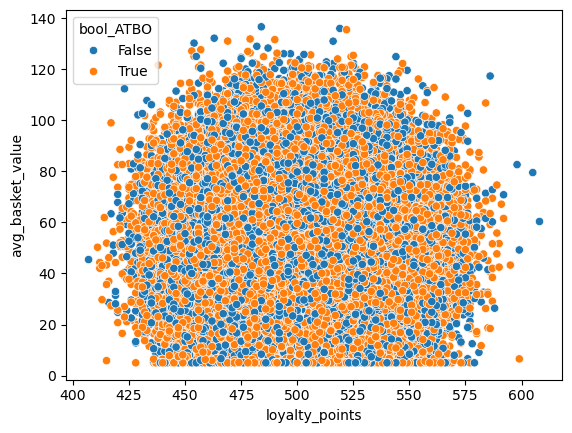

In [35]:
sns.scatterplot(df_ATBO, x='loyalty_points', y='avg_basket_value', hue='bool_ATBO')

In [36]:
ATBO_missing = df_ATBO.loc[df_ATBO['bool_ATBO'] == False]

# sns.histplot(ATBO_missing, x='days_since_last_purchase')

orders = np.array(ATBO_missing['avg_time_between_orders'])

bins = np.array([0, 5, 10, 20, 30, 60, 90, 100])

order_bins = np.digitize(orders, bins=bins)

bin_counts = np.bincount(order_bins)

for i, count in enumerate(bin_counts):
    if i == 0:
        print(f"< {bins[0]:,.0f}: {count}")
    elif i < len(bins):
        print(f"{bins[i-1]:,.0f}-{bins[i]:,.0f}: {count}")
    else:
        print(f"> {bins[-1]:,.0f}: {count}")

< 0: 0
0-5: 48314
5-10: 26447
10-20: 25171
20-30: 8976
30-60: 8083
60-90: 2072
90-100: 510
> 100: 1268


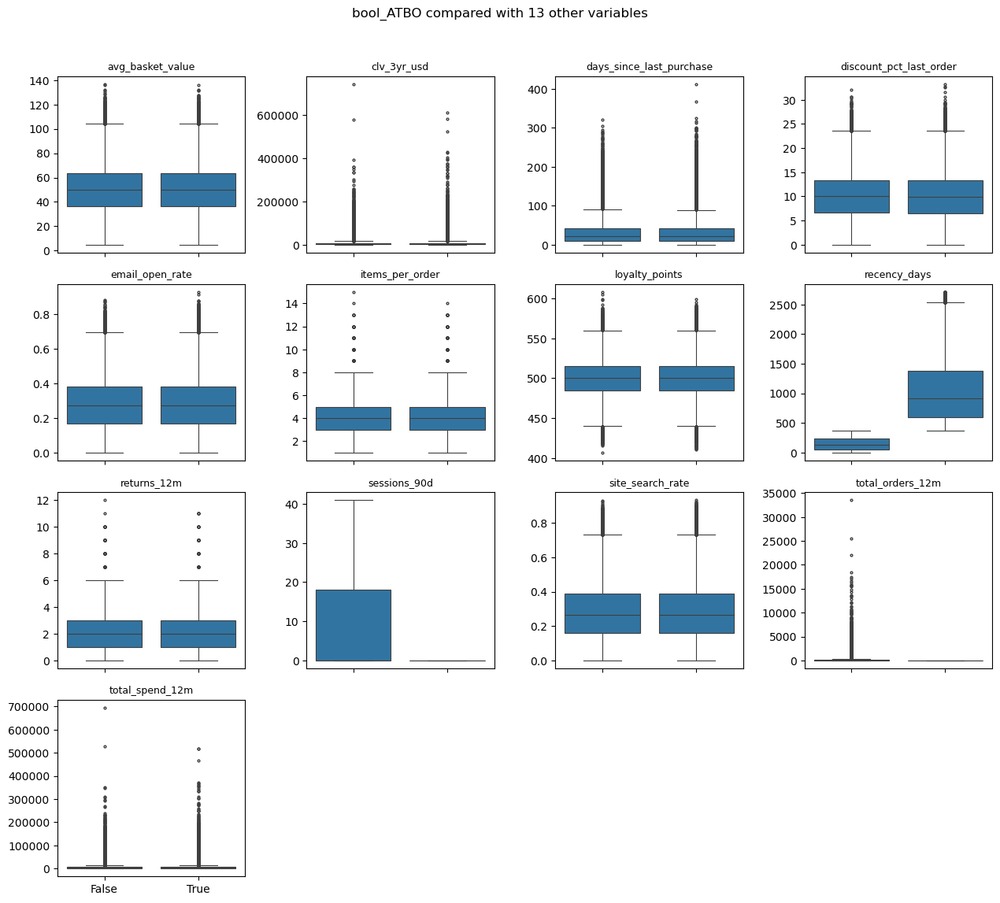

In [37]:
# bivariate analysis to see if there is a visual difference in users that have null avg time between orders
import math

focus = 'bool_ATBO'
others = df_ATBO.drop(columns=['customer_id', 'avg_time_between_orders'], axis=1).select_dtypes(include='number').columns.difference([focus])
n_panels = len(others)


n_cols = 4
n_rows = math.ceil(n_panels / n_cols)

fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(3.2*n_cols, 2.8*n_rows),
                          sharex=True,  sharey=False)
axes = axes.flatten()


for ax, col in zip(axes, others):
    sns.boxplot(data=df_ATBO, x=focus, y=col,
                orient='v', ax=ax, fliersize=2, linewidth=.8)
    ax.set_title(col, fontsize=9)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', rotation=0)


for extra in axes[n_panels:]:
    extra.set_visible(False)

fig.suptitle(f'{focus} compared with {n_panels} other variables',
             fontsize=12, y=1.02)
fig.tight_layout()
plt.show()


### Analysis shows a difference in recency days, sessions_90d, and total_orders_12m

In [38]:
df_ATBO.loc[df_ATBO['bool_ATBO'] == True].describe()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,returns_12m,site_search_rate,email_open_rate,discount_pct_last_order,total_orders_12m,avg_time_between_orders,clv_3yr_usd,date_pulled
count,179159.000000,179159,179159,179159.000000,179159.000000,179159.000000,179159.0,179159.000000,179159.000000,179159.000000,179159.000000,179159.000000,179159.000000,179159.000000,179159.0,0.0,179159.000000,179159
mean,150011.618691,2020-10-08 14:48:51.623019264,2022-08-11 08:29:47.472036608,1036.145418,6198.242411,50.074550,0.0,29.968185,4.000262,499.992297,2.001541,0.285746,0.276281,9.997774,0.0,NaN,6891.474012,2025-06-13 00:00:00
min,2.000000,2018-01-01 00:00:00,2018-01-09 12:30:27.446097851,366.000000,9.840000,5.000000,0.0,0.000000,1.000000,411.000000,0.000000,0.000289,0.000000,0.000000,0.0,NaN,116.630000,2025-06-13 00:00:00
25%,74912.500000,2019-04-23 00:00:00,2021-09-07 12:53:10.075661312,597.000000,1320.435000,36.500000,0.0,9.000000,3.000000,485.000000,1.000000,0.161160,0.169303,6.533690,0.0,NaN,1561.135000,2025-06-13 00:00:00
50%,149973.000000,2020-09-02 00:00:00,2022-12-15 16:52:25.078574592,910.000000,2967.120000,50.010000,0.0,21.000000,4.000000,500.000000,2.000000,0.264902,0.271151,9.956131,0.0,NaN,3365.620000,2025-06-13 00:00:00
75%,225136.000000,2022-02-25 00:00:00,2023-10-24 04:30:51.371425024,1374.000000,6701.575000,63.480000,0.0,41.000000,5.000000,515.000000,3.000000,0.389682,0.380146,13.367898,0.0,NaN,7445.005000,2025-06-13 00:00:00
max,299999.000000,2024-06-11 00:00:00,2024-06-11 23:58:02.858078957,2711.000000,518341.370000,135.570000,0.0,412.000000,14.000000,599.000000,11.000000,0.932675,0.927149,33.240327,0.0,NaN,611839.570000,2025-06-13 00:00:00
std,86665.312715,NaN,NaN,527.931564,11205.858947,19.807889,0.0,29.962187,1.728520,22.287970,1.417776,0.159920,0.155704,4.954846,0.0,NaN,12337.478423,NaN


< 0: 0
0-5: 24963
5-10: 23625
10-20: 37033
20-30: 26526
30-60: 42446
60-90: 15571
90-100: 2534
> 100: 6461


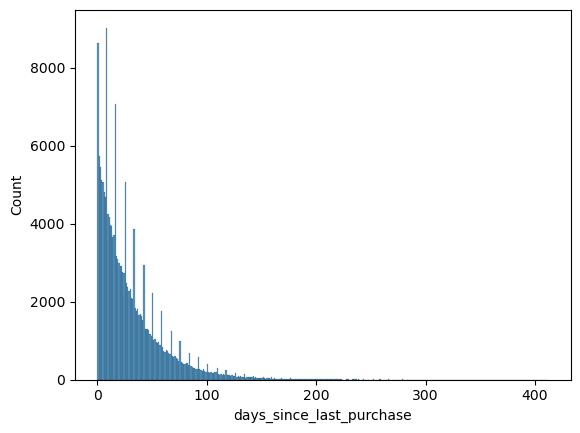

In [39]:
ATBO_missing = df_ATBO.loc[df_ATBO['bool_ATBO'] == True]

sns.histplot(ATBO_missing, x='days_since_last_purchase')

orders = np.array(ATBO_missing['days_since_last_purchase'])

bins = np.array([0, 5, 10, 20, 30, 60, 90, 100])

order_bins = np.digitize(orders, bins=bins)

bin_counts = np.bincount(order_bins)

for i, count in enumerate(bin_counts):
    if i == 0:
        print(f"< {bins[0]:,.0f}: {count}")
    elif i < len(bins):
        print(f"{bins[i-1]:,.0f}-{bins[i]:,.0f}: {count}")
    else:
        print(f"> {bins[-1]:,.0f}: {count}")

<Axes: xlabel='sessions_90d', ylabel='Count'>

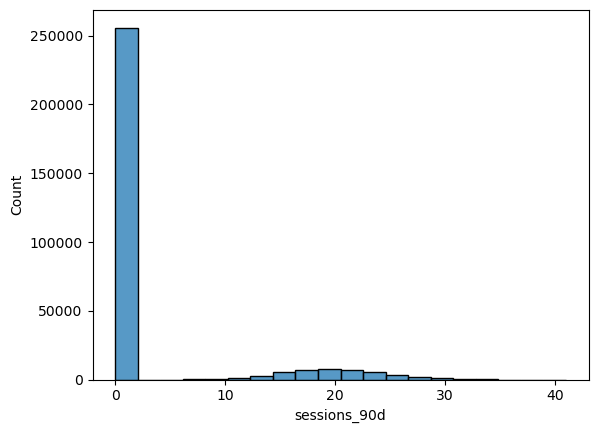

In [40]:
sns.histplot(data=df_ATBO, x='sessions_90d')

43459

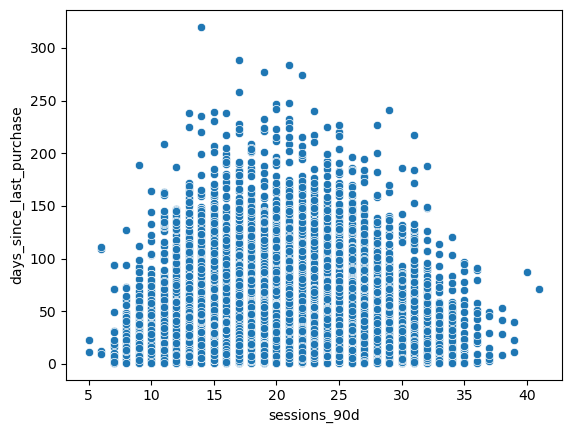

In [41]:

# sns.scatterplot(data=df_ATBO.loc[(df_ATBO['sessions_90d']>0) & (df_ATBO['days_since_last_purchase']>0) ], x='sessions_90d', y='days_since_last_purchase')
# len(df_ATBO.loc[(df_ATBO['sessions_90d']>0) & (df_ATBO['days_since_last_purchase']>0) ])

## See if the below code can be used to impute the avg_time_between_orders

In [42]:
df_ATBO.loc[df_ATBO['sessions_90d']==0]

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,...,is_premium_member,marketing_opt_in,preferred_device,country_code,customer_segment,primary_browser,next_product_cat,clv_3yr_usd,date_pulled,bool_ATBO
1,2,2020-01-08,2020-10-29 06:21:54.215300560,1687,7185.10,42.50,0,1,5,485,...,No,Yes,Other,DE,Segment_10,Browser_17,Home_Garden,7867.41,2025-06-13,True
2,3,2023-03-22,2024-05-18 17:34:30.651219606,390,11067.80,61.66,0,42,6,506,...,Yes,Yes,Desktop,IT,Segment_10,Browser_1,Sports,13294.63,2025-06-13,True
3,4,2021-09-18,2024-01-29 17:50:06.211375475,500,659.84,39.83,0,57,3,441,...,No,Yes,Tablet,NO,Segment_20,Browser_15,Sports,800.40,2025-06-13,True
4,5,2021-12-23,2023-02-10 13:14:47.794090986,853,4831.90,49.10,0,19,2,463,...,No,Yes,Desktop,IE,Segment_20,Browser_1,Apparel,5704.24,2025-06-13,True
5,6,2023-04-15,2025-01-25 23:08:27.521924972,138,2046.53,46.96,0,9,9,511,...,No,No,Desktop,US,Segment_2,Browser_19,Apparel,2480.54,2025-06-13,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299992,299993,2020-08-06,2022-03-15 21:50:32.034918308,1185,1902.27,49.67,0,16,6,472,...,Yes,No,SmartTV,DE,Segment_12,Browser_3,Electronics,2002.74,2025-06-13,True
299993,299994,2020-06-28,2023-09-22 03:49:21.287733316,629,7498.32,34.02,0,7,2,500,...,No,No,Desktop,BR,Segment_15,Browser_2,Home_Garden,8189.72,2025-06-13,True
299996,299997,2020-06-17,2025-02-11 19:53:32.808164597,121,3522.56,56.41,0,4,1,532,...,Yes,Yes,Desktop,IE,Segment_17,Browser_8,Beauty,3949.57,2025-06-13,False
299998,299999,2022-01-17,2024-04-12 09:07:31.972873211,426,10446.64,47.54,0,4,6,493,...,Yes,Yes,Other,GB,Segment_7,Browser_3,Electronics,11844.12,2025-06-13,True


<Figure size 1400x900 with 0 Axes>

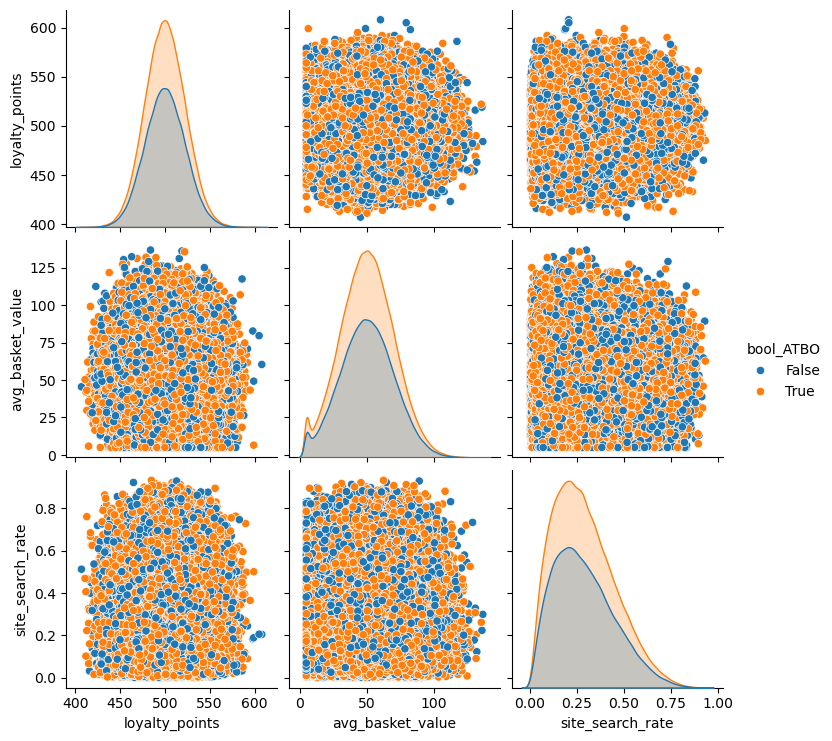

In [43]:
# Feature space exploration
cols_of_interest = ['loyalty_points', 'avg_basket_value', 'site_search_rate']


plt.figure(figsize=wide_plt)
sns.pairplot(df_ATBO, vars=cols_of_interest, hue='bool_ATBO')
# plt.title('Pairplot of Columns of Interest')
plt.show()

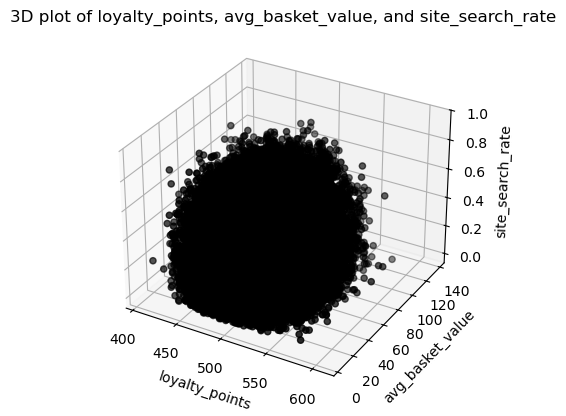

In [44]:
# Local structure validation for KNN imputation
from mpl_toolkits import mplot3d

# soot sprite
fig = plt.figure()
ax = plt.axes(projection='3d')

x = df_ATBO[cols_of_interest[0]]
y = df_ATBO[cols_of_interest[1]]
z = df_ATBO[cols_of_interest[2]]


ax.scatter(x, y, z, c='black')
ax.set_title(f'3D plot of {cols_of_interest[0]}, {cols_of_interest[1]}, and {cols_of_interest[2]}')
ax.set_xlabel(cols_of_interest[0])
ax.set_ylabel(cols_of_interest[1])
ax.set_zlabel(cols_of_interest[2])
plt.show()

In [46]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import time

In [47]:
%%time
features_for_distance = ['loyalty_points', 'avg_basket_value', 'site_search_rate', 'avg_time_between_orders']

scaler = StandardScaler()
df_ATBO[features_for_distance] = scaler.fit_transform(df_ATBO[features_for_distance])

imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(df_ATBO[features_for_distance])

# Assign the imputed data back to the DataFrame
df_ATBO[features_for_distance] = imputed_data
# Inverse transform to revert features for distance to original scales
df_ATBO[features_for_distance] = scaler.inverse_transform(df_ATBO[features_for_distance])

CPU times: total: 1h 3min 51s
Wall time: 25min 57s


Safe to impute email_open_rate with KNN


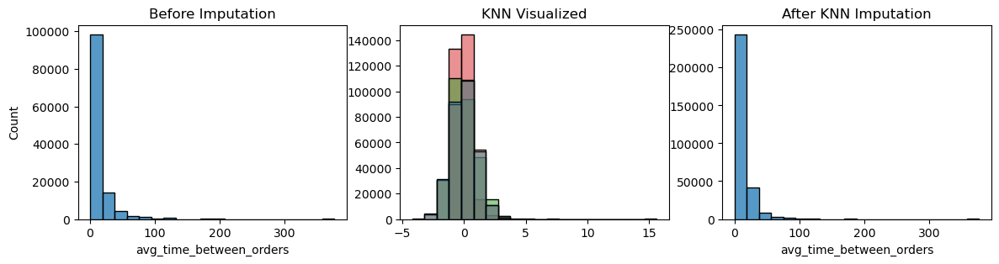

CPU times: total: 1.08 s
Wall time: 1.18 s


In [48]:
%%time
print("Safe to impute email_open_rate with KNN")
plt.figure(figsize=[14,3])
plt.subplot(1, 3, 1)
sns.histplot(df_revised['avg_time_between_orders'], bins=20)
plt.title('Before Imputation')
plt.subplot(1, 3, 2)
sns.histplot(imputed_data, legend=False, bins=20)
plt.title('KNN Visualized')
plt.ylabel(ylabel='')
plt.subplot(1, 3, 3)
sns.histplot(df_ATBO['avg_time_between_orders'], bins=20)
plt.title('After KNN Imputation')
plt.ylabel(ylabel='')
plt.show()

In [49]:
df_ATBO.isna().sum()

customer_id                 0
signup_date                 0
last_activity_ts            0
recency_days                0
total_spend_12m             0
avg_basket_value            0
sessions_90d                0
days_since_last_purchase    0
items_per_order             0
loyalty_points              0
returns_12m                 0
site_search_rate            0
email_open_rate             0
discount_pct_last_order     0
total_orders_12m            0
avg_time_between_orders     0
is_premium_member           0
marketing_opt_in            0
preferred_device            0
country_code                0
customer_segment            0
primary_browser             0
next_product_cat            0
clv_3yr_usd                 0
date_pulled                 0
bool_ATBO                   0
dtype: int64

In [50]:
df_ATBO.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   customer_id               300000 non-null  int64         
 1   signup_date               300000 non-null  datetime64[ns]
 2   last_activity_ts          300000 non-null  datetime64[ns]
 3   recency_days              300000 non-null  int64         
 4   total_spend_12m           300000 non-null  float64       
 5   avg_basket_value          300000 non-null  float64       
 6   sessions_90d              300000 non-null  int64         
 7   days_since_last_purchase  300000 non-null  int64         
 8   items_per_order           300000 non-null  int64         
 9   loyalty_points            300000 non-null  float64       
 10  returns_12m               300000 non-null  int64         
 11  site_search_rate          300000 non-null  float64       
 12  em

In [51]:
df_ATBO.to_csv('CLEANED_synthetic_ecommerce_2025-06-13_Version2.csv', index=False)

In [52]:
df_ATBO.describe()

,customer_id,signup_date,last_activity_ts,recency_days,total_spend_12m,avg_basket_value,sessions_90d,days_since_last_purchase,items_per_order,loyalty_points,returns_12m,site_search_rate,email_open_rate,discount_pct_last_order,total_orders_12m,avg_time_between_orders,clv_3yr_usd,date_pulled
count,300000.000000,300000,300000,300000.000000,300000.000000,300000.00000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000
mean,150000.500000,2021-09-21 13:18:40.504049920,2023-08-02 15:27:55.843986176,679.856327,6194.101341,50.08110,2.937477,29.965033,4.000120,499.949783,2.000243,0.285783,0.275968,9.999802,66.333653,13.088845,6900.419667,2025-06-13 00:00:00
min,1.000000,2018-01-01 00:00:00,2018-01-09 12:30:27.446097851,0.000000,9.840000,5.00000,0.000000,0.000000,1.000000,407.000000,0.000000,0.000289,0.000000,0.000000,0.000000,0.100000,116.630000,2025-06-13 00:00:00
25%,75000.750000,2019-11-12 00:00:00,2022-08-08 12:13:25.450714368,184.000000,1323.002500,36.48000,0.000000,9.000000,3.000000,485.000000,1.000000,0.161185,0.169322,6.551370,0.000000,4.740000,1578.235000,2025-06-13 00:00:00
50%,150000.500000,2021-09-22 00:00:00,2024-01-20 05:17:24.062454528,509.000000,2975.475000,49.99000,0.000000,21.000000,4.000000,500.000000,2.000000,0.264657,0.270496,9.968305,0.000000,9.100000,3389.295000,2025-06-13 00:00:00
75%,225000.250000,2023-08-01 00:00:00,2024-12-10 13:08:45.863225600,1039.000000,6705.050000,63.50000,0.000000,42.000000,5.000000,515.000000,3.000000,0.389466,0.379674,13.359288,44.000000,15.800000,7472.862500,2025-06-13 00:00:00
max,300000.000000,2025-06-12 00:00:00,2025-06-12 23:59:44.059004784,2711.000000,694278.250000,136.71000,41.000000,412.000000,15.000000,608.000000,12.000000,0.932675,0.927149,33.240327,33567.000000,376.400000,744597.890000,2025-06-13 00:00:00
std,86602.684716,NaN,NaN,599.398069,11169.398333,19.81922,7.279116,29.913803,1.731788,22.310618,1.417447,0.159940,0.155528,4.948754,287.251192,17.168165,12289.212628,NaN


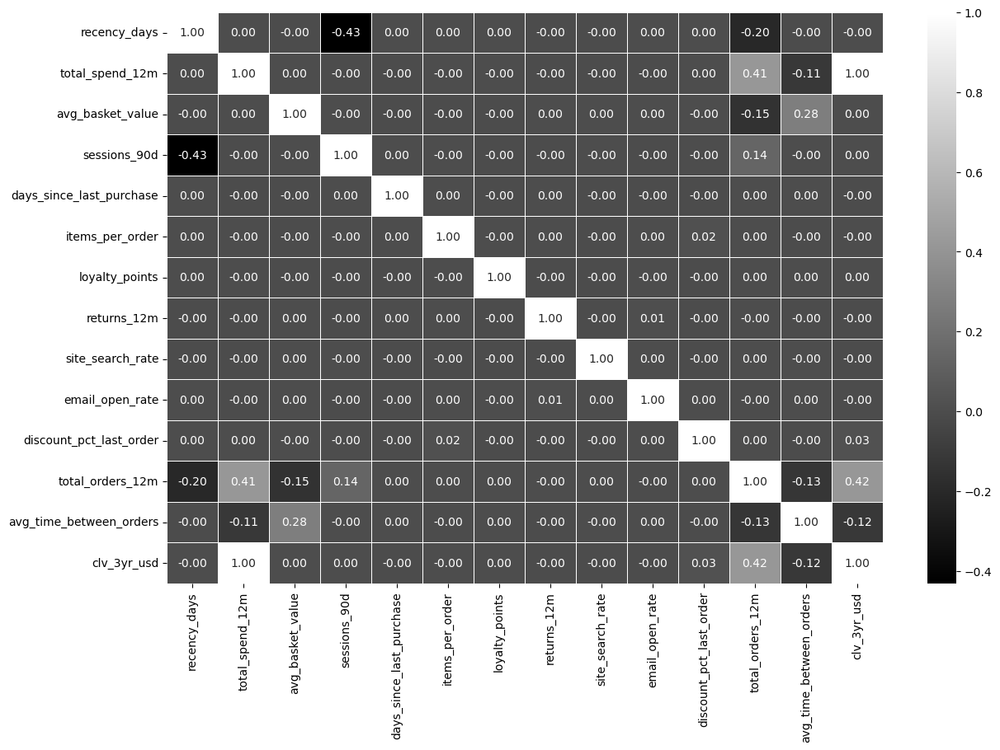

In [53]:
# corr_data = df_missingness.dropna(axis=0, how='any')
# corr_data = corr_data.drop(columns='customer_id')

# ['total_spend_12m', 'avg_basket_value', 'clv_3yr_usd']

# corr_matrix = df_missingness.dropna(axis=0, how='any').select_dtypes(include='number')
corr_matrix = df_ATBO.select_dtypes(include='number')
corr_matrix = corr_matrix.drop(columns=['customer_id'])
corr_matrix = corr_matrix.corr()

plt.figure(figsize=wide_plt)
sns.heatmap(corr_matrix, annot=True, cmap='gray', fmt='.2f', linewidth=.5)
plt.show()



In [54]:
df_cleaned = df_ATBO.copy()

## Review corrected signup dates

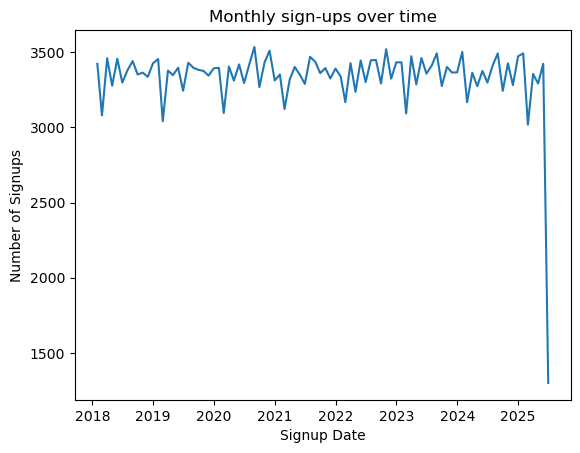

In [55]:
# validate corrected dataset
monthly = (
    df_revised.set_index('signup_date').resample('ME').size().rename('signups').reset_index()
)

sns.lineplot(data=monthly, x='signup_date', y='signups')
plt.xlabel('Signup Date')
plt.ylabel('Number of Signups')
plt.title('Monthly sign-ups over time')
plt.show()

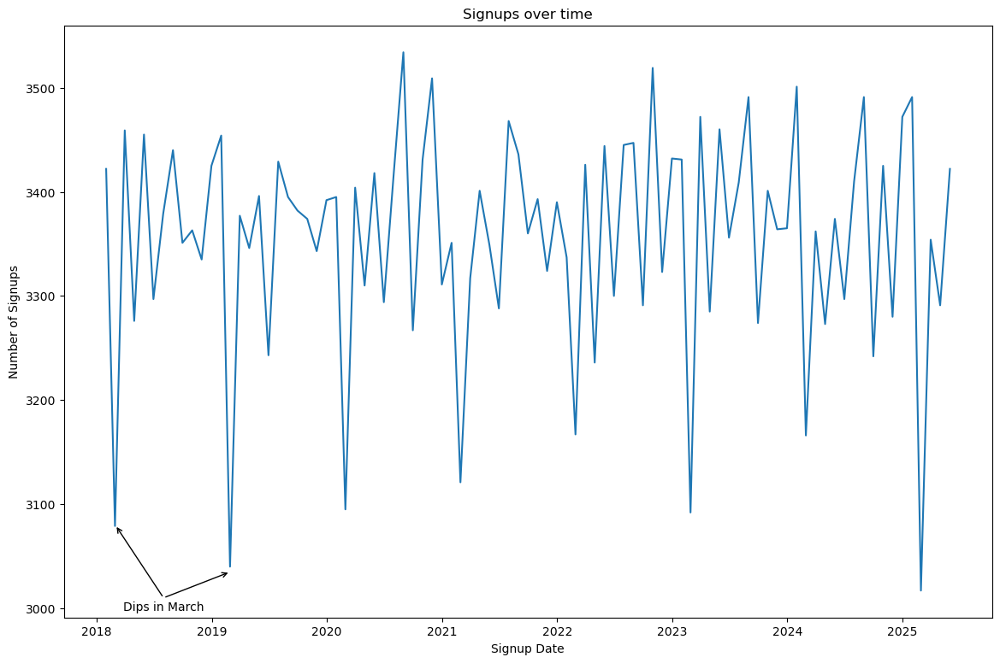

In [56]:
# Observation in data that can be used for later
import datetime

arrow_x = datetime.datetime(2018, 8, 1)
arrow_y = 3010

targets = [
    (datetime.datetime(2018, 3, 1), 3080),
    (datetime.datetime(2019, 3, 1), 3035)
]

clean_signups = monthly[(monthly['signup_date'].dt.to_period('M') != '2025-06')]
plt.figure(figsize=wide_plt)
sns.lineplot(data=clean_signups, x='signup_date', y='signups')
plt.text(arrow_x, arrow_y-12, 'Dips in March', fontsize=10, color='black', ha='center')
for x, y in targets:
    plt.annotate(
        '',
        xy=(x,y),
        xytext=(arrow_x, arrow_y),
        arrowprops=dict(arrowstyle='->', color='black')
    )
plt.xlabel('Signup Date')
plt.ylabel('Number of Signups')
plt.title('Signups over time')
plt.show()

# Observe Outliers

In [57]:
%who_ls DataFrame

['ATBO_missing',
 'LP_anomalies',
 'bad_signup_date',
 'clean_signups',
 'corr_matrix',
 'daily',
 'df',
 'df_ATBO',
 'df_cleaned',
 'df_missing_emails',
 'df_missingness',
 'df_revised',
 'df_types',
 'explore_df',
 'impute_date',
 'impute_disc',
 'impute_email_zero',
 'missing_date',
 'missing_disc',
 'missing_email',
 'monthly']

In [58]:
# isolate numeric dtypes
df_num = df_cleaned.drop(['customer_id'], axis=1).select_dtypes(include='number')

spend_cols = ['total_spend_12m', 'avg_basket_value', 'clv_3yr_usd']
purch_cols = ['days_since_last_purchase', 'items_per_order', 'returns_12m', 'total_orders_12m', 'avg_time_between_orders']
cons_cols = ['recency_days', 'sessions_90d', 'site_search_rate', 'email_open_rate', 'discount_pct_last_order', 'loyalty_points']

all_cols = spend_cols + purch_cols + cons_cols

# df_num[all_cols]

In [59]:
# Check the distributions of numeric features to determine outlier detection method

"""
Function that creates hist and box plots for a feature
"""
# create a function to display plots
def plots(data, columns):
    for i in data[columns]:
        plt.figure(figsize=[14,3])
        plt.subplot(1, 2, 1)
        sns.histplot(data, x=i, kde=True, bins=30)
        plt.title(f'{i} Distribution')
        plt.subplot(1, 2, 2)
        sns.boxplot(data, y=i)
        plt.xlabel(f'{i}')
        plt.title(f'{i} Boxplot')
        plt.show()

# checking for outliers
# develop a function to check the IQR


"""
Function that evaluates series for both IQR and MAD outlier methods
"""
# outlier detector functions returns boolean
def outlier_flag(data, column):
    series = data[column]
    def flag_outliers_iqr(series):
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        return (series < lower_bound) | (series > upper_bound)
    
    def flag_outliers_mad(series, threshold=3):
        median = series.median()
        abs_deviation = np.abs(series - median)
        mad = abs_deviation.median()
        outlier_threshold = threshold * mad
        return abs_deviation > outlier_threshold
        
    data[f'IQR_{column}'] = flag_outliers_iqr(series)
    data[f'MAD_{column}'] = flag_outliers_mad(series)
    return data

"""
Function to isolate outliers for analysis
"""
# outlier detector functions. Returns DataFrames
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

def detect_outliers_mad(data, column, threshold=3):
    median = data[column].median()
    abs_deviation = np.abs(data[column] - median)
    mad = abs_deviation.median()
    outlier_threshold = threshold * mad
    outliers = data[abs_deviation > outlier_threshold]
    return outliers

"""
Function to remove outliers from the Data
"""
# outlier removal functions
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_removed = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return outliers_removed

def remove_outliers_mad(data, column, threshold=3):
    median = data[column].median()
    abs_deviation = np.abs(data[column] - median)
    mad = abs_deviation.median()
    outlier_threshold = threshold * mad
    outliers_removed = data[abs_deviation < outlier_threshold]
    return outliers_removed

"""
Function that adds additional statistics to .describe()
"""
def desc_ex(df):
    num = df.select_dtypes(include='number')

    desc = df.describe()

    median = pd.Series(num.median(), name='median')
    skew = pd.Series(num.skew(), name='skewness')
    kurt = pd.Series(num.kurtosis(), name='kurtosis')
    cv = pd.Series(num.std() / num.mean(), name='coefficient_of_variation')

    add_stats = pd.DataFrame([median, skew, kurt, cv])
    ex_stats = pd.concat([desc, add_stats])
    return ex_stats

In [60]:
desc_ex(df_num[all_cols])

,total_spend_12m,avg_basket_value,clv_3yr_usd,days_since_last_purchase,items_per_order,returns_12m,total_orders_12m,avg_time_between_orders,recency_days,sessions_90d,site_search_rate,email_open_rate,discount_pct_last_order,loyalty_points
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,6194.101341,50.081100,6900.419667,29.965033,4.000120,2.000243,66.333653,13.088845,679.856327,2.937477,0.285783,0.275968,9.999802,499.949783
std,11169.398333,19.819220,12289.212628,29.913803,1.731788,1.417447,287.251192,17.168165,599.398069,7.279116,0.159940,0.155528,4.948754,22.310618
min,9.840000,5.000000,116.630000,0.000000,1.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000289,0.000000,0.000000,407.000000
25%,1323.002500,36.480000,1578.235000,9.000000,3.000000,1.000000,0.000000,4.740000,184.000000,0.000000,0.161185,0.169322,6.551370,485.000000
50%,2975.475000,49.990000,3389.295000,21.000000,4.000000,2.000000,0.000000,9.100000,509.000000,0.000000,0.264657,0.270496,9.968305,500.000000
75%,6705.050000,63.500000,7472.862500,42.000000,5.000000,3.000000,44.000000,15.800000,1039.000000,0.000000,0.389466,0.379674,13.359288,515.000000
max,694278.250000,136.710000,744597.890000,412.000000,15.000000,12.000000,33567.000000,376.400000,2711.000000,41.000000,0.932675,0.927149,33.240327,608.000000
median,2975.475000,49.990000,3389.295000,21.000000,4.000000,2.000000,0.000000,9.100000,509.000000,0.000000,0.264657,0.270496,9.968305,500.000000
skewness,9.495705,0.075930,9.694542,1.991792,0.573152,0.711049,26.991558,7.415844,0.972045,2.226975,0.596871,0.204215,0.118646,0.047155


## Spend Behavior Plots

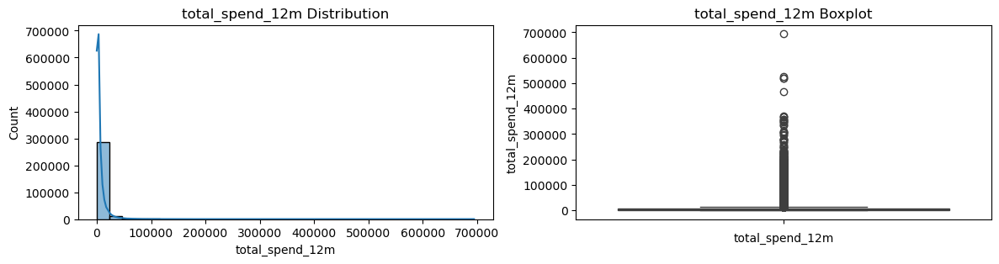

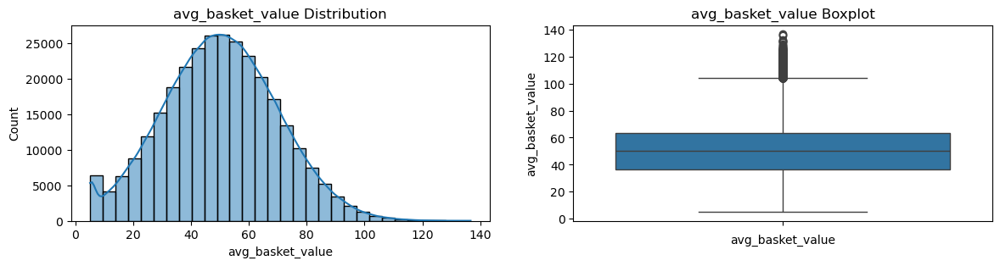

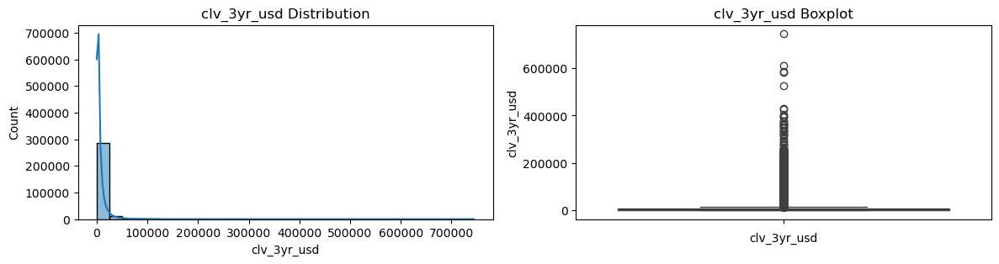

In [61]:
# spend behavior plots
plots(df_num, spend_cols)

## Purchase Behavior Plots

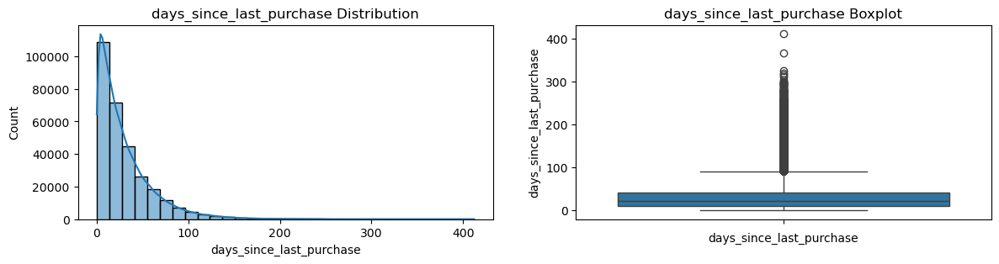

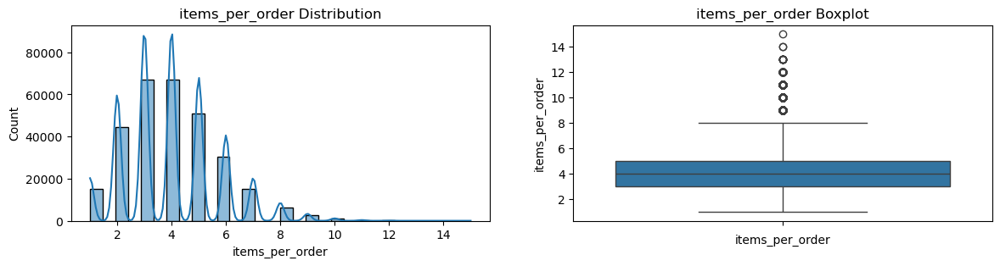

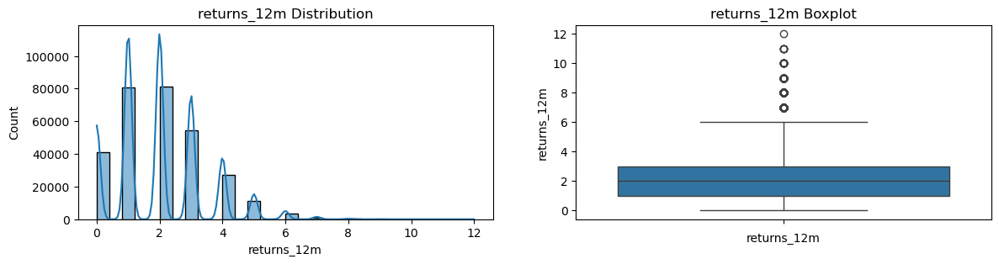

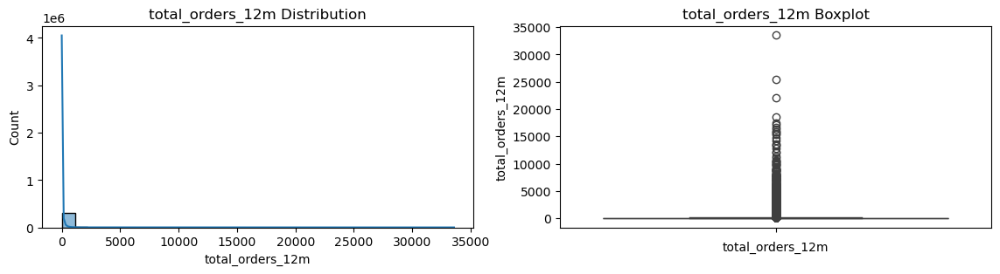

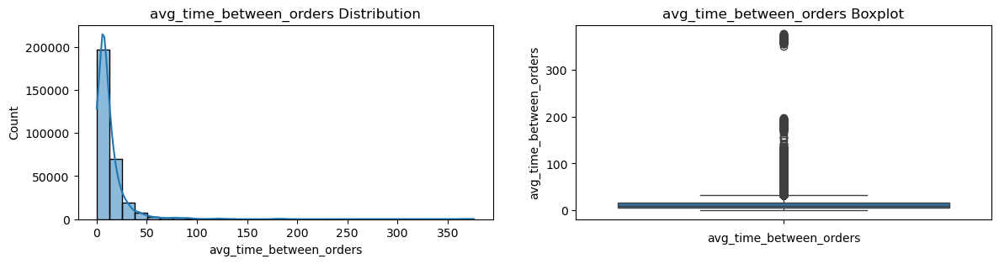

In [62]:
# purchase behavior plots
plots(df_num, purch_cols)

## Consumer Behavior Plots

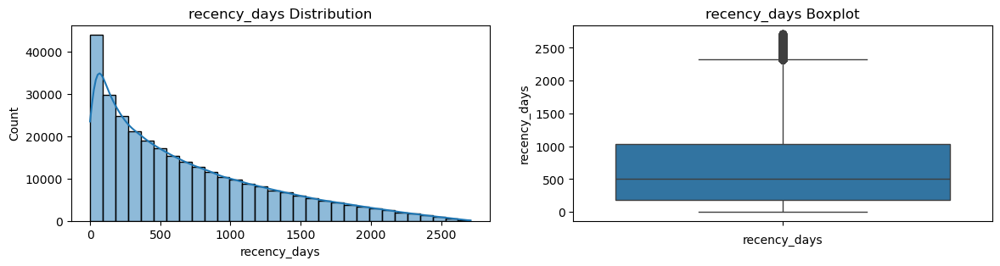

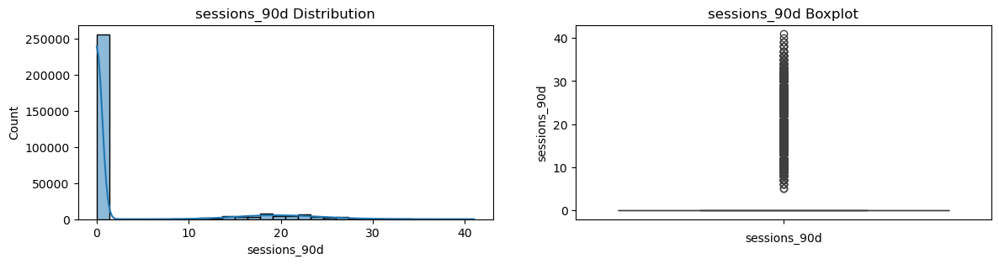

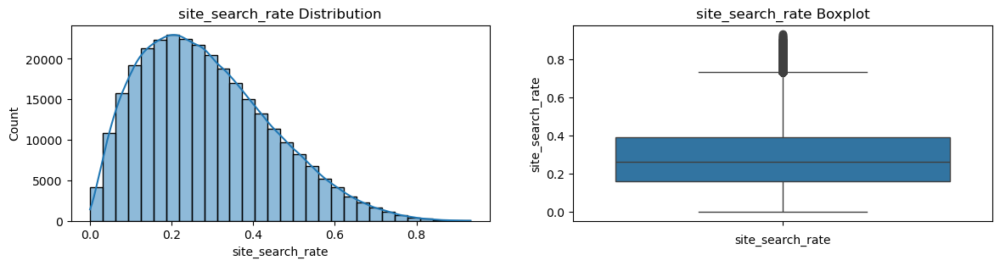

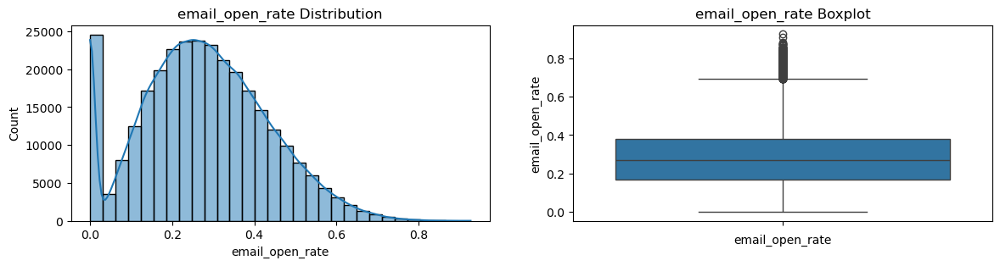

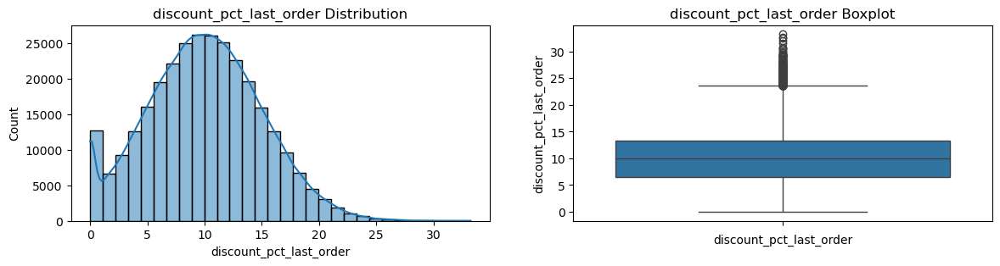

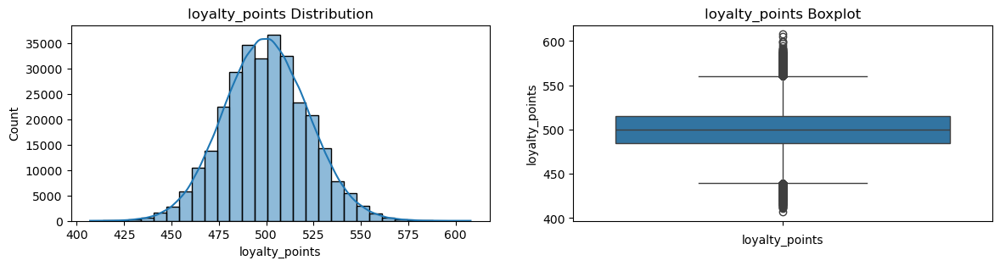

In [63]:
# consumer behavior plots
plots(df_num, cons_cols)

In [64]:
df_outliers = df_num.copy()

for i in all_cols:
    df_outliers = outlier_flag(df_outliers, i)


flag_cols = [i for i in df_outliers.columns if i.startswith('IQR_') or i.startswith('MAD_')]
outlier_flags_df = df_outliers[flag_cols]

In [65]:
melt_df = outlier_flags_df.melt(var_name='feature name', value_name='is outlier')

pivot_table = pd.pivot_table(
    melt_df,
    index='feature name',
    columns='is outlier',
    aggfunc='size',
    fill_value=0
).rename(columns={False: 'Not Outlier', True: 'Outlier'}).map(lambda x: f"{x:,}")

pivot_table

is outlier,Not Outlier,Outlier
feature name,,
IQR_avg_basket_value,"298,939","1,061"
IQR_avg_time_between_orders,"279,870","20,130"
IQR_clv_3yr_usd,"272,415","27,585"
IQR_days_since_last_purchase,"285,913","14,087"
IQR_discount_pct_last_order,"298,942","1,058"
IQR_email_open_rate,"298,683","1,317"
IQR_items_per_order,"296,372","3,628"
IQR_loyalty_points,"297,944","2,056"
IQR_recency_days,"296,606","3,394"
